In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sns.set()

%matplotlib inline

## Loading the data

### Track coordinates

In [3]:
track = pd.read_csv('data/CA1_6_1_track.csv', header=None) # coordinates
track.columns = ['time', 'x', 'y']
track.set_index('time', inplace=True)
track.index = (track.index * 20).astype(np.int32)
track.head()

,x,y
time,,
1,-10.618986,1.045508
2,-11.600195,1.371564
3,-12.577124,1.717142
4,-13.551862,2.083993
5,-14.512914,2.497923


### Neuropil

In [8]:
neuropil = pd.read_csv('data/CA1_6_1_neuropil.csv', header=None, index_col=0) # neurons
neuropil.index.names = ['time']
neuropil.index = (neuropil.index * 20).astype(np.int32)

# making it match fine_cells
neuropil.columns = (neuropil.columns - 1).astype(str) + 'N' # to differentiate it from a number

# aligning the rows to match track and fine_cells
neuropil = neuropil.loc[647:, :].reset_index()
neuropil['time'] = neuropil['time'] - 646
neuropil.set_index('time', inplace=True)

neuropil.head()

,0N,1N,2N,3N,4N,5N,6N,7N,8N,9N,...,580N,581N,582N,583N,584N,585N,586N,587N,588N,589N
time,,,,,,,,,,,,,,,,,,,,,
1,-0.002934,-0.002239,0.000845,-0.000191,0.018179,0.002266,-0.001677,-0.000652,-0.002532,-0.005300,...,0.009806,-0.003243,-0.002325,-0.000460,0.005267,0.008778,0.008849,0.003470,0.001455,-0.002240
2,-0.004061,-0.003564,0.002370,-0.003619,0.017365,-0.000518,-0.001709,-0.004011,-0.004835,-0.002587,...,0.007742,-0.002837,-0.001337,-0.000094,0.003998,0.009368,0.009396,0.003687,-0.001638,-0.001919
3,-0.002164,-0.002635,0.000981,-0.001702,0.017278,0.002372,-0.002508,-0.003894,-0.001754,-0.005893,...,0.005949,-0.001452,-0.000011,-0.000207,0.006297,0.009328,0.006953,0.003336,0.000240,-0.003030
4,-0.003558,-0.005556,0.000519,-0.002884,0.013902,0.003492,-0.002478,-0.004923,-0.004490,-0.003553,...,0.009733,-0.002536,0.001108,0.000418,0.007100,0.011831,0.007619,0.004714,-0.002084,-0.002159
5,-0.004191,-0.003141,0.002763,-0.002097,0.015821,0.006337,0.000688,-0.005050,-0.003774,-0.004155,...,0.007605,-0.003587,-0.000978,-0.000112,0.004959,0.006470,0.007963,0.006876,-0.001403,-0.002426


### Fine (not) cells

In [9]:
fine_cells = pd.read_csv('data/CA1_6_1_fine_cells.csv', index_col=0)
#fine_cells.rename(columns={"time,s\cell#": "time"}, inplace=True)
#fine_cells.set_index('time', inplace=True)
fine_cells.index.names = ['time']
fine_cells.index = (fine_cells.index * 20).astype(np.int32)
fine_cells.columns = fine_cells.columns.astype(str) + 'N'
fine_cells.head()

,4N,69N,92N,116N,123N,128N,136N,143N,147N,153N,...,188N,192N,208N,231N,273N,354N,408N,543N,570N,577N
time,,,,,,,,,,,,,,,,,,,,,
1,0.018179,-0.024777,-0.006565,-0.012388,-0.008887,-0.012914,-0.015549,-0.006735,-0.012197,-0.018785,...,0.009529,-0.001906,0.043256,-0.005412,-0.001835,-0.004913,-0.006586,-0.005296,-0.007407,-0.002616
2,0.017365,-0.022071,-0.006246,-0.013401,-0.006372,-0.013255,-0.017807,-0.006125,-0.013311,-0.018717,...,0.012430,-0.000354,0.042603,-0.005423,-0.003040,-0.003705,-0.006257,-0.005749,-0.007352,-0.003265
3,0.017278,-0.022216,-0.004703,-0.009781,-0.005761,-0.011657,-0.013116,-0.010442,-0.011870,-0.017295,...,0.012656,0.001288,0.041309,-0.003618,-0.000195,-0.001868,-0.005974,-0.005802,-0.004829,-0.003245
4,0.013902,-0.021415,-0.003486,-0.010803,-0.003996,-0.014408,-0.015875,-0.009822,-0.010226,-0.019532,...,0.010340,0.001612,0.043249,-0.006278,-0.001035,-0.006251,-0.006020,-0.005568,-0.006260,-0.003475
5,0.015821,-0.022920,-0.000751,-0.011077,-0.001041,-0.012884,-0.014639,-0.008761,-0.013454,-0.017255,...,0.007611,0.005419,0.039358,-0.004703,-0.001926,-0.006696,-0.008204,-0.004500,-0.004808,-0.002429


### Joining cells data with track

In [10]:
track.shape, neuropil.shape, fine_cells.shape

((6124, 2), (6124, 590), (6124, 24))

In [11]:
df = neuropil.join(track, how='inner')

# WARNING: transposed version
df.head().T

time,1,2,3,4,5
0N,-0.002934,-0.004061,-0.002164,-0.003558,-0.004191
1N,-0.002239,-0.003564,-0.002635,-0.005556,-0.003141
2N,0.000845,0.002370,0.000981,0.000519,0.002763
3N,-0.000191,-0.003619,-0.001702,-0.002884,-0.002097
4N,0.018179,0.017365,0.017278,0.013902,0.015821
...,...,...,...,...,...
587N,0.003470,0.003687,0.003336,0.004714,0.006876
588N,0.001455,-0.001638,0.000240,-0.002084,-0.001403
589N,-0.002240,-0.001919,-0.003030,-0.002159,-0.002426
x,-10.618986,-11.600195,-12.577124,-13.551862,-14.512914


## Utility functions

In [12]:
def get_segment(coordinates, cx = 0, cy = 0, n=10):
    """
    Returns a segment of a circle centered at (cx, cy)

    Parameters
    ----------
    coordinates : {x, y}
        coordinates of a point
    cx : float
        x of the circle's center
    cy : float
        y of the circle's center
    n : int
        number of segments

    Returns
    -------
    int
        i-th segment corresponding to the given coordinates

    """
    segment = 360 / n
    return (np.angle((coordinates['x'] - cx) + 1j * (coordinates['y'] - cy), deg=True)+360) % 360 // segment


def acc_1(y_pred, y_true):
    # simple accuracy
    return np.sum(y_pred == y_true) / len(y_true)

# TODO fix
def acc_3(y_pred, y_true, num_segments=10):
    # 3-accuracy
    p = y_pred.astype(int)
    t = y_true.astype(int)
    return np.sum((np.abs(p - t) <= 1.) | (np.abs(p - t) == num_segments-1)) / len(y_true)

In [13]:
from math import pi
from math import cos, sin
def generate_xy(center, radius, n=100):
    """
    returns a list of n coordinates of a circle on xy plane

    Parameters
    ----------
    center : (x, y)
        center of the circle
    radius : float
        radius of the circle
    n : int
        number of points

    Returns
    -------
    list
        coordinates of the circle on xy plane (x, y)

    """
    a = [] # the resulting array
    delta = 2 * pi / n
    angles = np.arange(0, 2 * pi, delta)
    for phi in angles:
        x = radius * cos(phi) + center[0]
        y = radius * sin(phi) + center[1]
        a.append((x, y))
    return a

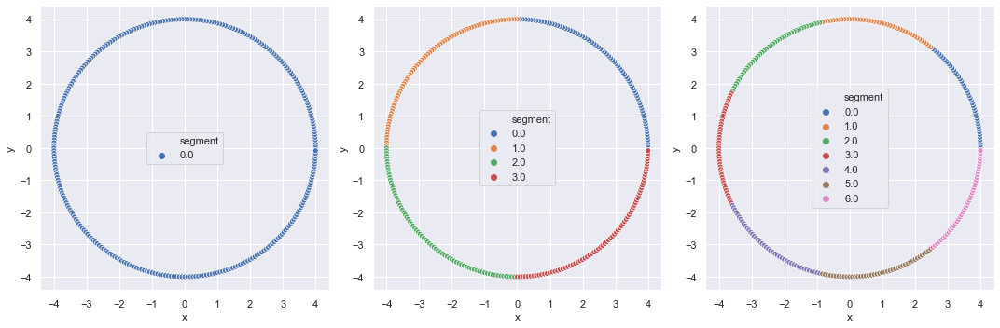

In [14]:
fig, ax = plt.subplots(figsize=(15, 5), ncols=3)


for i in range(1, 10, 3):
    generated_circle = pd.DataFrame(generate_xy((0, 0), 4, n=300),columns=['x','y'])
    generated_circle['segment'] = get_segment(generated_circle, n=i)
    generated_circle['segment'] = generated_circle['segment'].astype('category')
    sns.scatterplot(x='x', y='y', hue='segment', data=generated_circle, ax=ax[(i-1) // 3])
fig.tight_layout()

## Getting the coordinates of the circle

In [15]:
x_max, y_max = df[['x', 'y']].max()
x_min, y_min = df[['x', 'y']].min()

radius_x = (x_max - x_min) / 2
radius_y = (y_max - y_min) / 2
radius = (radius_x+radius_y)/2

cx1 = x_max - radius
cx2 = x_min + radius
cx = (cx1 + cx2) / 2
cy1 = y_max - radius
cy2 = y_min + radius
cy = (cy1 + cy2) / 2

## Splitting the circle into segments

In [16]:
NUM_SEGMENTS=10

In [17]:
df['segment'] = get_segment(df, n=NUM_SEGMENTS)
df['segment'] = df['segment'].astype('category') # for better visualization

### Generating a circle

In [18]:
generated_circle = pd.DataFrame(generate_xy((cx, cy), radius, n=300),columns=['x','y'])
generated_circle['segment'] = get_segment(generated_circle, n=NUM_SEGMENTS)
generated_circle['segment'] = generated_circle['segment'].astype('category')

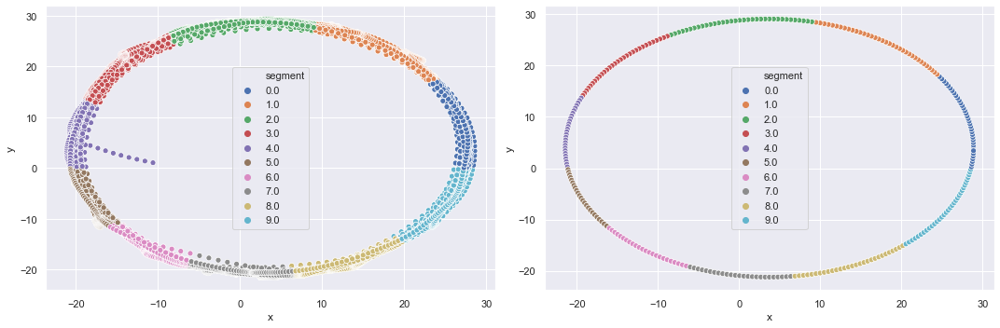

In [19]:
fig, ax = plt.subplots(figsize=(15, 5), ncols=2)

sns.scatterplot(x='x', y='y', hue='segment', data=df, ax=ax[0])
sns.scatterplot(x='x', y='y', hue='segment', data=generated_circle, ax=ax[1]);
fig.tight_layout()

In [20]:
# ??? where did it come from
df[(df['x'] < -10) & (df['x'] > -15) & (df['y'] > 0) & (df['y'] < 5)]

,0N,1N,2N,3N,4N,5N,6N,7N,8N,9N,...,583N,584N,585N,586N,587N,588N,589N,x,y,segment
time,,,,,,,,,,,,,,,,,,,,,
1,-0.002934,-0.002239,0.000845,-0.000191,0.018179,0.002266,-0.001677,-0.000652,-0.002532,-0.005300,...,-0.000460,0.005267,0.008778,0.008849,0.003470,0.001455,-0.002240,-10.618986,1.045508,4.0
2,-0.004061,-0.003564,0.002370,-0.003619,0.017365,-0.000518,-0.001709,-0.004011,-0.004835,-0.002587,...,-0.000094,0.003998,0.009368,0.009396,0.003687,-0.001638,-0.001919,-11.600195,1.371564,4.0
3,-0.002164,-0.002635,0.000981,-0.001702,0.017278,0.002372,-0.002508,-0.003894,-0.001754,-0.005893,...,-0.000207,0.006297,0.009328,0.006953,0.003336,0.000240,-0.003030,-12.577124,1.717142,4.0
4,-0.003558,-0.005556,0.000519,-0.002884,0.013902,0.003492,-0.002478,-0.004923,-0.004490,-0.003553,...,0.000418,0.007100,0.011831,0.007619,0.004714,-0.002084,-0.002159,-13.551862,2.083993,4.0
5,-0.004191,-0.003141,0.002763,-0.002097,0.015821,0.006337,0.000688,-0.005050,-0.003774,-0.004155,...,-0.000112,0.004959,0.006470,0.007963,0.006876,-0.001403,-0.002426,-14.512914,2.497923,4.0


In [21]:
# just dropping that tail
df = df.drop(range(1, 6))
fine_cells = fine_cells.drop(range(1, 6))

# save 

In [23]:
df.to_csv("data/CA1_6_1_clean.csv")

## Mutual Information
TODO use simple linear regression?

just use sklearn.feature_selection

In [22]:
from sklearn.metrics import mutual_info_score

### preparing the data

In [24]:
X = df.drop(['x', 'y', 'segment'], axis='columns').copy()
y = df['segment'].copy()

In [25]:
# TODO try different discrete variable
for col in X.columns:
    quantiles = [X[col].quantile(q) for q in np.arange(0, 1, 0.1)]
    batches = np.zeros(len(y)).astype(int)
    for q in quantiles:
        batches += (X[col] - q >= 0)
    X[col] = batches

In [26]:
mis = X.apply(lambda col: mutual_info_score(col, y) / np.log(2), axis=0).copy()
mis = mis.sort_values(ascending=False)

In [27]:
mis = pd.DataFrame({'neuron': mis.index, 'score':mis})
mis['neuron'] = mis['neuron'].astype(str)

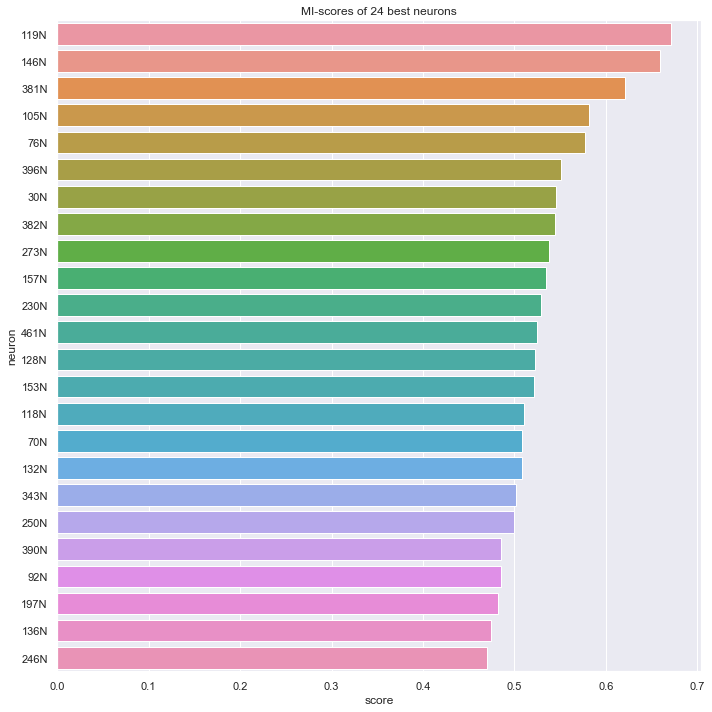

In [28]:
fig, ax = plt.subplots(figsize=(10, 10), ncols=1)

ax = sns.barplot(x='score', y='neuron', data=mis[:24], ax=ax);
ax.set_title("MI-scores of 24 best neurons");
fig.tight_layout();

### Comparing the obtained neurons with manually selected ones

In [44]:
fine_neurons = fine_cells.columns
mi_best_neurons = mis[:24]['neuron']
mi_worst_neurons = mis[-24:]['neuron']

fine_mi_intersect = set(fine_neurons) & set(mi_best_neurons)
print(f" Intersection with fine({len(fine_mi_intersect)}): {' '.join(fine_mi_intersect)}")

 Intersection with fine(5): 128N 273N 136N 153N 92N


In [46]:
mis.to_csv('data/mi_best_neurons.csv')

Note: indexing from 0

As you can see, the results reported in Robert's work are fully reproducible

## Feature selection

### Train-test split

#### TODO try different splitting

In [25]:
TRAIN_SIZE=0.7
TRAIN_SIZE_NUM = int(df.shape[0]*TRAIN_SIZE)

In [26]:
train_indeces = df[:int(df.shape[0]*TRAIN_SIZE)].index
test_indeces = df.drop(train_indeces).index

In [27]:
# old
# X = df.copy()
# X['segment'] = X['segment'].astype(int)
# X_train = X.loc[train_indeces]
# X_test = X.loc[test_indeces]
# y_train = X_train['segment']
# y_test = X_test['segment']
# X_train.drop(['segment', 'x', 'y'], axis='columns', inplace=True)
# X_test.drop(['segment', 'x', 'y'], axis='columns', inplace=True)

In [28]:
X = df.copy()
X['segment'] = X['segment'].astype(int)
X_train = X.loc[:TRAIN_SIZE_NUM]
X_test = X.loc[TRAIN_SIZE_NUM:]
y_train = X_train['segment']
y_test = X_test['segment']
X_train.drop(['segment', 'x', 'y'], axis='columns', inplace=True)
X_test.drop(['segment', 'x', 'y'], axis='columns', inplace=True)


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


## Catboost features

Idea: train catboost model -> select the most important columns for the model 

Training the model on 70% of the data

In [29]:
from catboost import CatBoostClassifier
cb_model = CatBoostClassifier(iterations=100,
                                loss_function='MultiClass',
                                eval_metric="Accuracy",
                                verbose=False)

In [30]:
cb_model.fit(X_train, y_train, plot=False, verbose=False);

### Accuracy of GB

In [31]:
y_preds = [
    (cb_model.predict(X_test).reshape(-1), 'GBDT')
]

pd.DataFrame([
    [name, acc_1(y_pred, y_test), acc_3(y_pred, y_test)]
    for y_pred, name in y_preds
], columns=['Name', '1-accuracy', '3-accuracy']).set_index('Name')

,1-accuracy,3-accuracy
Name,,
GBDT,0.592291,0.970684


### Getting feature importances

In [32]:
cbn = pd.DataFrame({"neuron":X_train.columns, "importance": cb_model.get_feature_importance()})
cbn = cbn.sort_values("importance", ascending=False)
cbn = cbn[cbn['importance'] > 0]
cbn.set_index('neuron')
cbn.head(10)

,neuron,importance
123,123N,4.626457
105,105N,4.071605
381,381N,3.840688
461,461N,3.446264
396,396N,3.254047
153,153N,3.099229
295,295N,2.934609
299,299N,2.708958
30,30N,2.255815
454,454N,2.163187


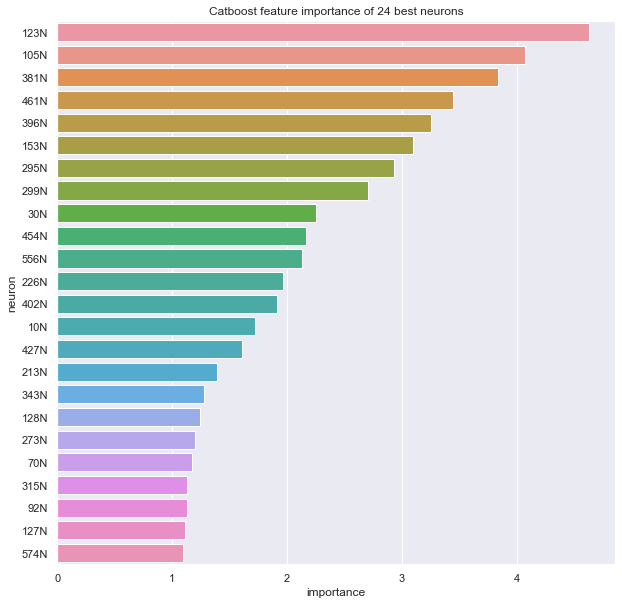

In [33]:
plt.figure(figsize=(10, 10))

ax = sns.barplot(x='importance', y='neuron', data=cbn[:24]);
ax.set_title("Catboost feature importance of 24 best neurons");
fig.tight_layout();

### Comparing the obtained neurons with manually selected ones

In [34]:
fine_neurons = fine_cells.columns
cbn_best_neurons = cbn[:24]['neuron']
cbn_worst_neurons = cbn[-24:]['neuron']

fine_cbn_intersect = set(fine_neurons) & set(cbn_best_neurons)
mi_cbn_intersect = set(mi_best_neurons) & set(cbn_best_neurons)
print(f" Intersection with fine({len(fine_cbn_intersect)}): {' '.join(fine_cbn_intersect)}")
print(f" Intersection with mi({len(mi_cbn_intersect)}): {' '.join(mi_cbn_intersect)}")

 Intersection with fine(5): 273N 92N 123N 128N 153N
 Intersection with mi(11): 273N 381N 92N 128N 461N 30N 396N 70N 105N 343N 153N


# Catboost accuracy

In [35]:
cb_model_fine = CatBoostClassifier(iterations=100,
                                   loss_function='MultiClass',
                                   eval_metric="Accuracy",
                                   verbose=False)
cb_model_fine.fit(X_train[fine_neurons],
                  y_train, plot=False, verbose=False);
y_preds = [
    (cb_model_fine.predict(X_test[fine_neurons]).reshape(-1), 'GBDT')
]

pd.DataFrame([
    [name, acc_1(y_pred, y_test), acc_3(y_pred, y_test)]
    for y_pred, name in y_preds
], columns=['Name', '1-accuracy', '3-accuracy']).set_index('Name')

,1-accuracy,3-accuracy
Name,,
GBDT,0.35722,0.95874


In [36]:
cb_model_mi = CatBoostClassifier(iterations=100,
                                   loss_function='MultiClass',
                                   eval_metric="Accuracy",
                                   verbose=False)
cb_model_mi.fit(X_train[mi_best_neurons],
                  y_train, plot=False, verbose=False);
y_preds = [
    (cb_model_mi.predict(X_test[mi_best_neurons]).reshape(-1), 'GBDT')
]

pd.DataFrame([
    [name, acc_1(y_pred, y_test), acc_3(y_pred, y_test)]
    for y_pred, name in y_preds
], columns=['Name', '1-accuracy', '3-accuracy']).set_index('Name')

,1-accuracy,3-accuracy
Name,,
GBDT,0.64658,0.970684


# Logistic regression accuracy

In [37]:
from sklearn.linear_model import LogisticRegression
lr_model_fine = LogisticRegression(random_state=0,
                                   penalty='l2',
                                   multi_class='ovr')
lr_model_fine.fit(X_train[fine_neurons], y_train)


y_preds = [
    (lr_model_fine.predict(X_test[fine_neurons]).reshape(-1), 'ovr Logistic regression')
]

pd.DataFrame([
    [name, acc_1(y_pred, y_test), acc_3(y_pred, y_test)]
    for y_pred, name in y_preds
], columns=['Name', '1-accuracy', '3-accuracy']).set_index('Name')

,1-accuracy,3-accuracy
Name,,
ovr Logistic regression,0.529859,0.715527


In [38]:
lr_model_mi = LogisticRegression(random_state=0,
                                   penalty='l2',
                                   multi_class='ovr')
lr_model_mi.fit(X_train[mi_best_neurons], y_train)


y_preds = [
    (lr_model_mi.predict(X_test[mi_best_neurons]).reshape(-1), 'ovr Logistic regression')
]

pd.DataFrame([
    [name, acc_1(y_pred, y_test), acc_3(y_pred, y_test)]
    for y_pred, name in y_preds
], columns=['Name', '1-accuracy', '3-accuracy']).set_index('Name')

,1-accuracy,3-accuracy
Name,,
ovr Logistic regression,0.523887,0.757329


## Simple logistic regression classifier features

### Without normalization

using [One-vs.-rest](https://en.wikipedia.org/wiki/Multiclass_classification#One-vs.-rest)

In [39]:
from sklearn.linear_model import LogisticRegression

lr_model = LogisticRegression(random_state=0, penalty='l2', multi_class='ovr').fit(X_train, y_train)


y_preds = [
    (lr_model.predict(X_test).reshape(-1), 'ovr Logistic regression')
]

pd.DataFrame([
    [name, acc_1(y_pred, y_test), acc_3(y_pred, y_test)]
    for y_pred, name in y_preds
], columns=['Name', '1-accuracy', '3-accuracy']).set_index('Name')

,1-accuracy,3-accuracy
Name,,
ovr Logistic regression,0.686211,0.938111


In [40]:
lrn = pd.DataFrame(lr_model.coef_.T, index=X_train.columns)
lrn.index.names = ['neuron']
lrn = lrn.reset_index()
lrn.head()

,neuron,0,1,2,3,4,5,6,7,8,9
0,0N,-0.102503,0.221471,0.019378,0.010466,-0.026774,0.043279,0.120742,-0.127558,-0.257188,0.056982
1,1N,-0.283008,-0.017021,-0.358504,-0.104628,-0.233189,-0.045322,0.381588,0.852090,0.261301,-0.345171
2,2N,-0.164574,-0.460397,1.837834,1.789312,0.180322,0.283833,-0.642285,0.232138,-0.588479,-0.743952
3,3N,-0.785539,0.861518,1.710148,-0.046959,-0.646613,-0.497909,-0.172191,0.156415,-0.339407,-0.587470
4,4N,-1.004347,0.339167,1.436891,-0.124085,-0.415930,0.753552,0.631395,-0.585074,-0.287138,-0.326846


Segment 0
	 Intersection with fine(4): 128N 153N 136N 116N
	 Intersection with mi(3): 128N 153N 136N
Segment 1
	 Intersection with fine(2): 147N 176N
	 Intersection with mi(0): 
Segment 2
	 Intersection with fine(4): 147N 128N 143N 170N
	 Intersection with mi(5): 381N 76N 128N 382N 343N
Segment 3
	 Intersection with fine(5): 147N 92N 143N 231N 153N
	 Intersection with mi(6): 250N 381N 92N 76N 343N 153N
Segment 4
	 Intersection with fine(4): 136N 153N 92N 231N
	 Intersection with mi(7): 381N 92N 76N 136N 157N 343N 153N
Segment 5
	 Intersection with fine(5): 188N 136N 170N 153N 577N
	 Intersection with mi(6): 381N 136N 30N 70N 343N 153N
Segment 6
	 Intersection with fine(4): 136N 273N 570N 69N
	 Intersection with mi(6): 273N 76N 136N 146N 119N 118N
Segment 7
	 Intersection with fine(1): 69N
	 Intersection with mi(1): 132N
Segment 8
	 Intersection with fine(3): 128N 143N 92N
	 Intersection with mi(7): 92N 128N 382N 157N 146N 119N 118N
Segment 9
	 Intersection with fine(6): 92N 136N 165N 1

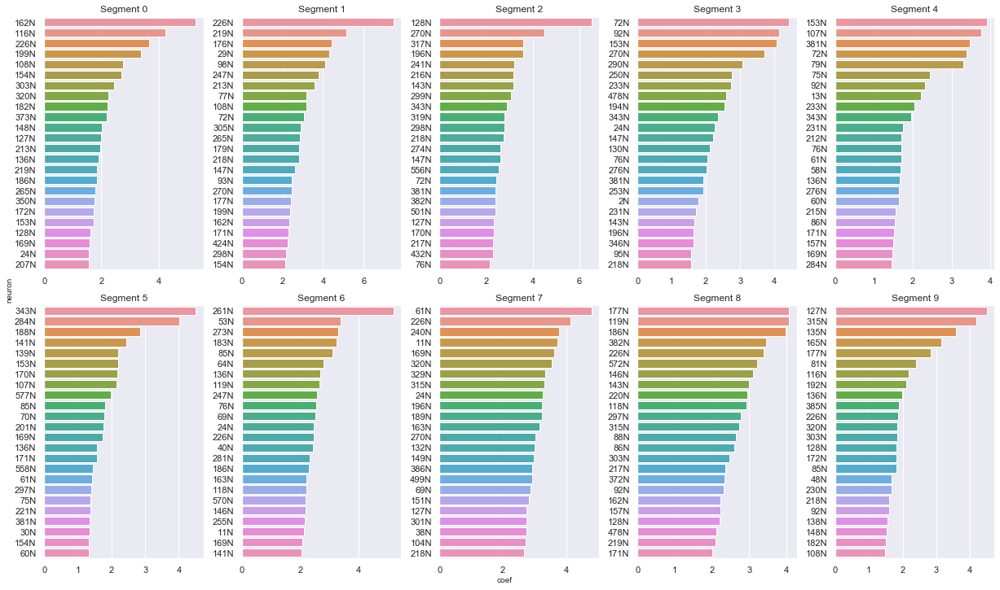

In [41]:
#plt.figure(figsize=(17, 10))
fig, _ = plt.subplots(sharex=True, sharey=True, figsize=(17, 10))
fig.text(0.5, 0.00, 'coef', ha='center')
fig.text(0.0, 0.5, 'neuron', va='center', rotation='vertical')

lr_best_neurons = []

for segment in range(NUM_SEGMENTS):
    plt.subplot(2, 5, segment + 1)
    s = lrn[['neuron', segment]].copy()
    s[segment] = abs(s[segment])
    s = s.sort_values(segment, ascending=False)[:24]
    s.rename(columns = {segment: 'coef'}, inplace = True)
    
    ax = sns.barplot(x='coef', y='neuron', data=s);
    
    
    lr_best_neurons.append(s['neuron'])
    fine_lr_intersect = set(fine_neurons) & set(s['neuron'])
    mi_lr_intersect = set(mi_best_neurons) & set(s['neuron'])
    
    
    ax.set_title(f"Segment {segment}");
    ax.set_ylabel("")
    ax.set_xlabel("")
    
    print(f"Segment {segment}")
    print(f"\t Intersection with fine({len(fine_lr_intersect)}): {' '.join(fine_lr_intersect)}")
    print(f"\t Intersection with mi({len(mi_lr_intersect)}): {' '.join(mi_lr_intersect)}")
    
fig.tight_layout();

### With feature scaling

In [42]:
from sklearn import preprocessing

X = df.copy()
y_train = X[:TRAIN_SIZE_NUM]['segment']
y_test = X[TRAIN_SIZE_NUM:]['segment']

X.drop(['segment', 'x', 'y'], axis='columns', inplace=True)
X_std = preprocessing.scale(X)

X_train = X_std[:TRAIN_SIZE_NUM]
X_test = X_std[TRAIN_SIZE_NUM:]

In [43]:
lr_model = LogisticRegression(random_state=0,
                              penalty='l2', 
                              multi_class='ovr',
                              max_iter=1000).fit(X_train, y_train)


y_preds = [
    (lr_model.predict(X_test).reshape(-1), 'ovr Logistic regression')
]

pd.DataFrame([
    [name, acc_1(y_pred, y_test), acc_3(y_pred, y_test)]
    for y_pred, name in y_preds
], columns=['Name', '1-accuracy', '3-accuracy']).set_index('Name')

,1-accuracy,3-accuracy
Name,,
ovr Logistic regression,0.546296,0.926471


In [44]:
lrstdn = pd.DataFrame(lr_model.coef_.T, index=X.columns)
lrstdn.index.names = ['neuron']
lrstdn = lrn.reset_index()
lrstdn.head()

,index,neuron,0,1,2,3,4,5,6,7,8,9
0,0,0N,-0.102503,0.221471,0.019378,0.010466,-0.026774,0.043279,0.120742,-0.127558,-0.257188,0.056982
1,1,1N,-0.283008,-0.017021,-0.358504,-0.104628,-0.233189,-0.045322,0.381588,0.852090,0.261301,-0.345171
2,2,2N,-0.164574,-0.460397,1.837834,1.789312,0.180322,0.283833,-0.642285,0.232138,-0.588479,-0.743952
3,3,3N,-0.785539,0.861518,1.710148,-0.046959,-0.646613,-0.497909,-0.172191,0.156415,-0.339407,-0.587470
4,4,4N,-1.004347,0.339167,1.436891,-0.124085,-0.415930,0.753552,0.631395,-0.585074,-0.287138,-0.326846


Segment 0
	 Intersection with fine(4): 128N 153N 136N 116N
	 Intersection with mi(3): 128N 153N 136N
Segment 1
	 Intersection with fine(2): 147N 176N
	 Intersection with mi(0): 
Segment 2
	 Intersection with fine(4): 147N 128N 143N 170N
	 Intersection with mi(5): 381N 76N 128N 382N 343N
Segment 3
	 Intersection with fine(5): 147N 92N 143N 231N 153N
	 Intersection with mi(6): 250N 381N 92N 76N 343N 153N
Segment 4
	 Intersection with fine(4): 136N 153N 92N 231N
	 Intersection with mi(7): 381N 92N 76N 136N 157N 343N 153N
Segment 5
	 Intersection with fine(5): 188N 136N 170N 153N 577N
	 Intersection with mi(6): 381N 136N 30N 70N 343N 153N
Segment 6
	 Intersection with fine(4): 136N 273N 570N 69N
	 Intersection with mi(6): 273N 76N 136N 146N 119N 118N
Segment 7
	 Intersection with fine(1): 69N
	 Intersection with mi(1): 132N
Segment 8
	 Intersection with fine(3): 128N 143N 92N
	 Intersection with mi(7): 92N 128N 382N 157N 146N 119N 118N
Segment 9
	 Intersection with fine(6): 92N 136N 165N 1

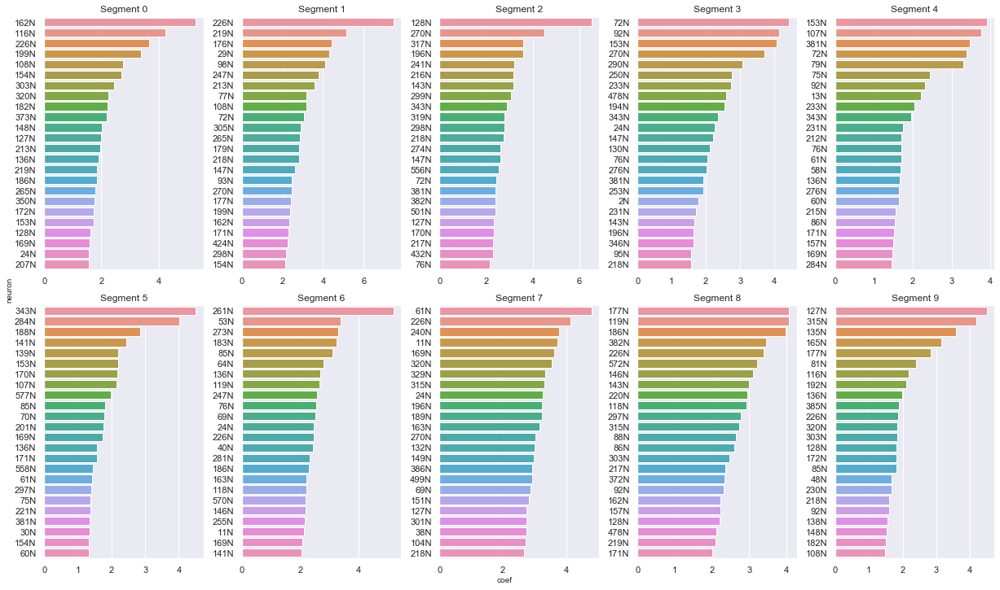

In [45]:
#plt.figure(figsize=(17, 10))
fig, _ = plt.subplots(sharex=True, sharey=True, figsize=(17, 10))
fig.text(0.5, 0.0, 'coef', ha='center')
fig.text(0.0, 0.5, 'neuron', va='center', rotation='vertical')

lrstd_best_neurons = []

for segment in range(NUM_SEGMENTS):
    plt.subplot(2, 5, segment + 1)
    s = lrn[['neuron', segment]].copy()
    s[segment] = abs(s[segment])
    s = s.sort_values(segment, ascending=False)[:24]
    s.rename(columns = {segment: 'coef'}, inplace = True)
    
    ax = sns.barplot(x='coef', y='neuron', data=s);
    
    
    lrstd_best_neurons.append(s['neuron'])
    fine_lr_intersect = set(fine_neurons) & set(s['neuron'])
    mi_lr_intersect = set(mi_best_neurons) & set(s['neuron'])
    
    
    ax.set_title(f"Segment {segment}");
    ax.set_ylabel("")
    ax.set_xlabel("")
    
    print(f"Segment {segment}")
    print(f"\t Intersection with fine({len(fine_lr_intersect)}): {' '.join(fine_lr_intersect)}")
    print(f"\t Intersection with mi({len(mi_lr_intersect)}): {' '.join(mi_lr_intersect)}")
    
fig.tight_layout();

[catboost model interpretation](https://duckduckgo.com/?q=catboost+model+interpretation&t=ffab&ia=web)

## TSNE

In [46]:
def get_angle(coordinates, cx = 0, cy = 0, n=10):
    return (np.angle((coordinates['x'] - cx) + 1j * (coordinates['y'] - cy), deg=True)+360) % 360

def embedded_plot(X_embedded, title=''):
    train = X_embedded[:TRAIN_SIZE_NUM]
    test = X_embedded[TRAIN_SIZE_NUM:]
    plt.figure(figsize=(16,5))
    plt.subplot(1, 2, 1)
    plt.scatter(train[:, 0], train[:, 1],
            c=get_angle(df)[:TRAIN_SIZE_NUM],
            cmap='hsv',
            linewidth=0,
            s=5)
    plt.title(f'{title} Embedding of the first 70% of data')
    
    plt.subplot(1, 2, 2)
    plt.scatter(test[:, 0], test[:, 1],
            c=get_angle(df)[TRAIN_SIZE_NUM:],
            cmap='hsv',
            linewidth=0,
            s=5)
    plt.title(f'{title} Embedding of the last 30% of data')
    plt.colorbar()

In [47]:
from sklearn.manifold import TSNE
np.random.seed(228)
X_embedded_tsne = TSNE(n_components=2, perplexity=100).fit_transform(df[mi_best_neurons])

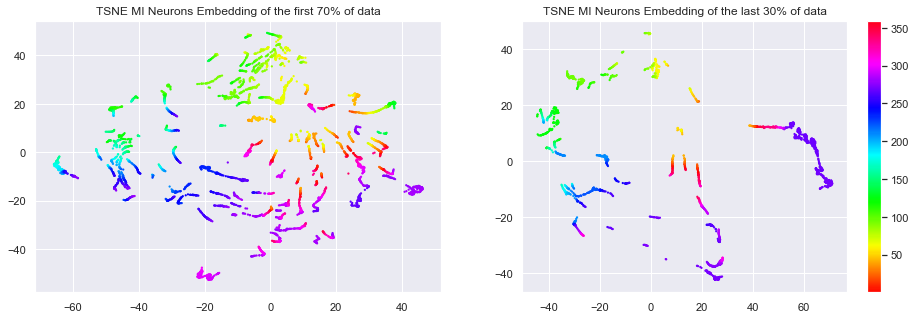

In [48]:
embedded_plot(X_embedded_tsne, "TSNE MI Neurons")

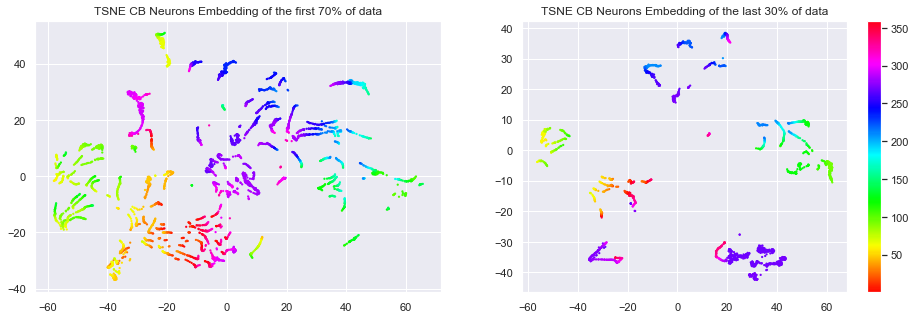

In [49]:
X_embedded_tsne = TSNE(n_components=2, perplexity=100).fit_transform(df[cbn_best_neurons])
embedded_plot(X_embedded_tsne, "TSNE CB Neurons")

### TODO plot the cells

mi_best_neurons - neurons with the greatest mutual information

cbn_best_neurons - best neurons based on gradient boosting algorithm

lr_best_neurons - array of arrays of neurons corresponding to a concrete segment

In [50]:
from sklearn.preprocessing import quantile_transform

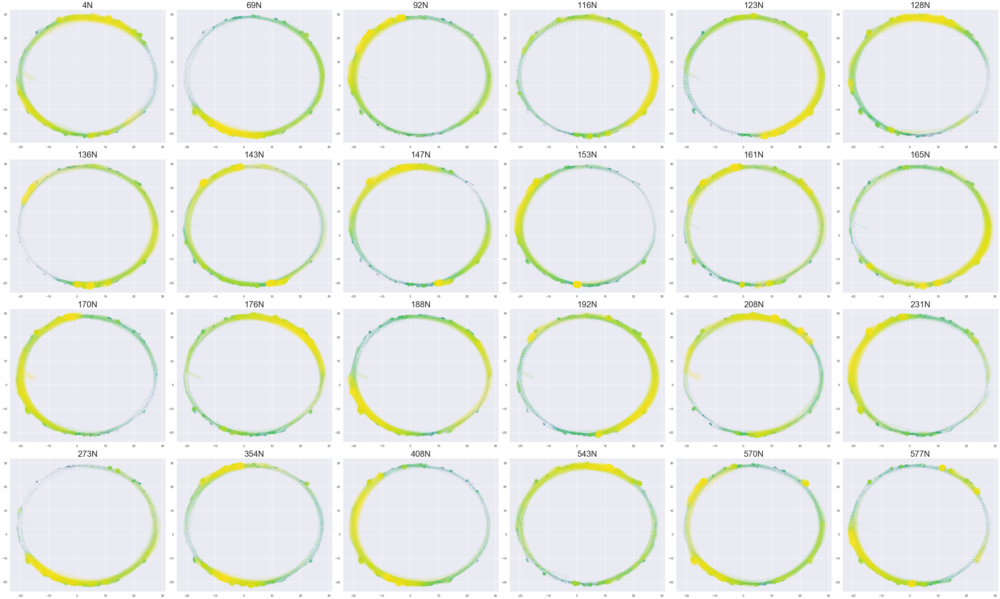

In [51]:
plt.figure(figsize=(50, 30))

for i, col in enumerate(fine_neurons):
    plt.subplot(4, 6, i + 1)
    plt.title(col, fontsize=30)
    s = df.loc[:, ['x', 'y', col]].sort_values(col)
    s[col] = quantile_transform(s[col].values.reshape(-1, 1), copy=True)
    plt.scatter(s['x'], s['y'],
                c=s[col],
                cmap='viridis',
                linewidth=0,
                s=np.exp(6.5*s[col]),
                alpha=0.1,
                edgecolors='none')
plt.tight_layout();

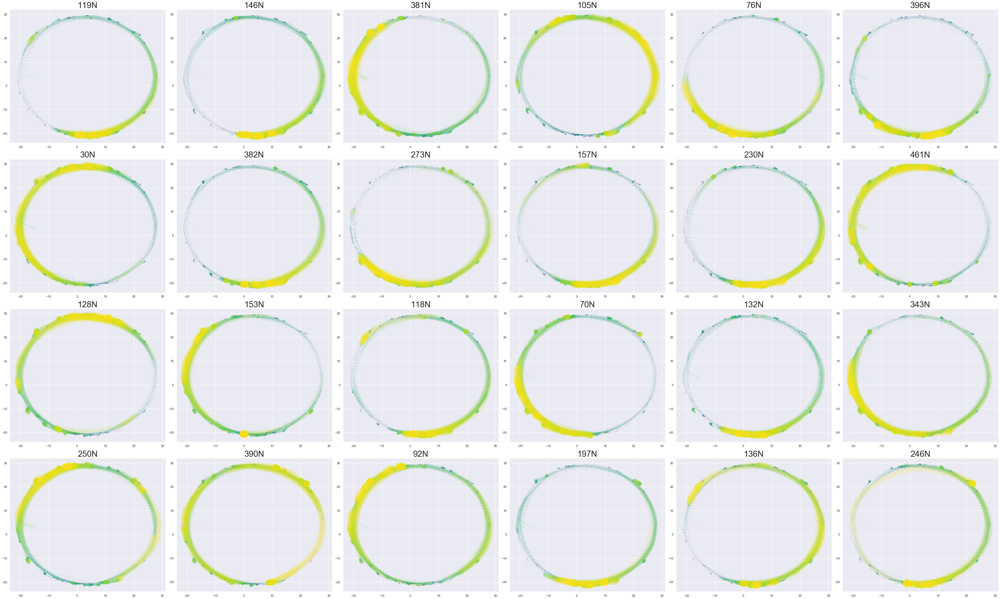

In [52]:
plt.figure(figsize=(50, 30))

for i, col in enumerate(mi_best_neurons):
    plt.subplot(4, 6, i + 1)
    plt.title(col, fontsize=30)
    s = df.loc[:, ['x', 'y', col]].sort_values(col)
    s[col] = quantile_transform(s[col].values.reshape(-1, 1), copy=True)
    plt.scatter(s['x'], s['y'],
                c=s[col],
                cmap='viridis',
                linewidth=0,
                s=np.exp(6.5*s[col]),
                alpha=0.1,
                edgecolors='none')
plt.tight_layout();

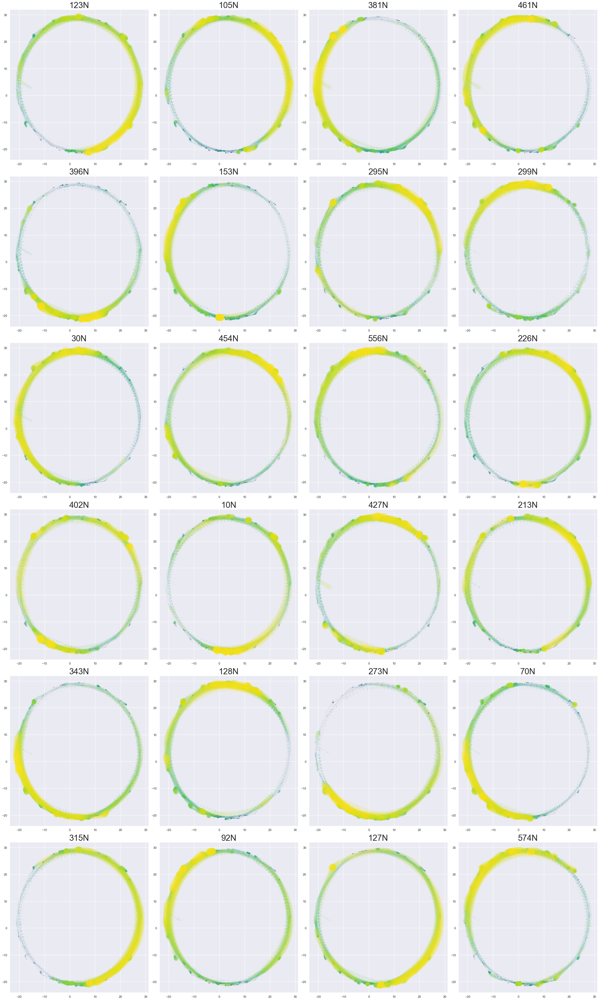

In [53]:
plt.figure(figsize=(30, 50))

for i, col in enumerate(cbn_best_neurons):
    plt.subplot(6, 4, i + 1)
    plt.title(col, fontsize=30)
    s = df.loc[:, ['x', 'y', col]].sort_values(col)
    s[col] = quantile_transform(s[col].values.reshape(-1, 1), copy=True)
    plt.scatter(s['x'], s['y'],
                c=s[col],
                cmap='viridis',
                linewidth=0,
                s=np.exp(6.5*s[col]),
                alpha=0.1,
                edgecolors='none')
plt.tight_layout();

## Neurons for every segment

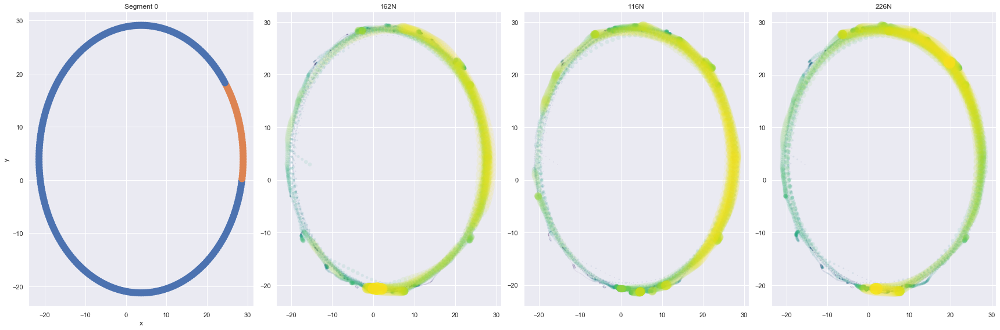

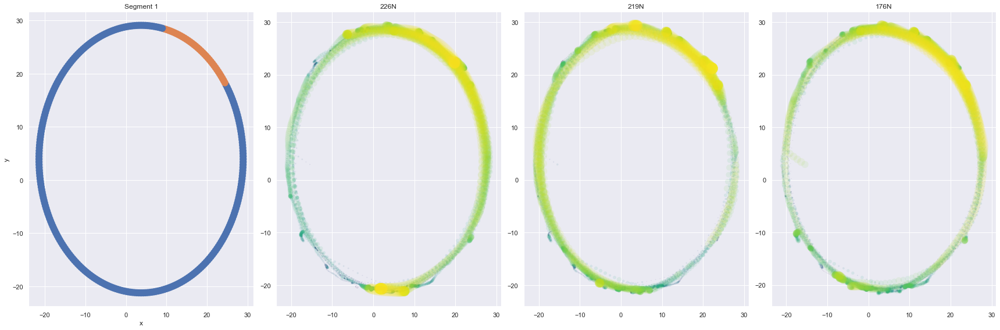

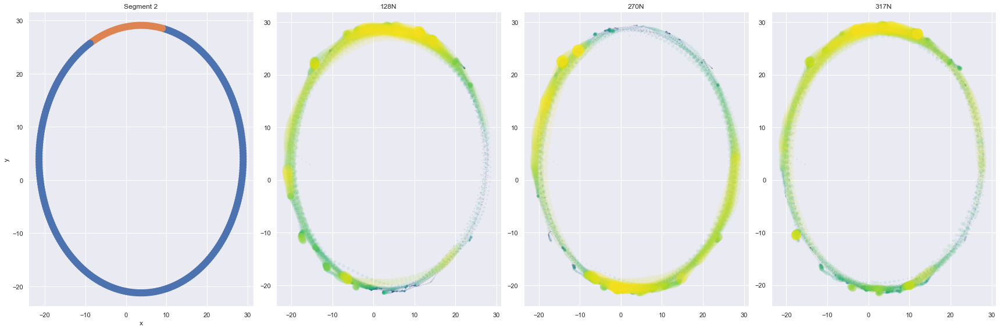

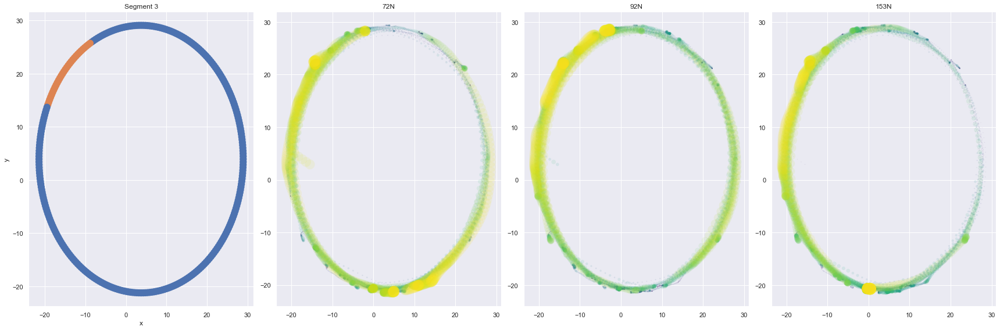

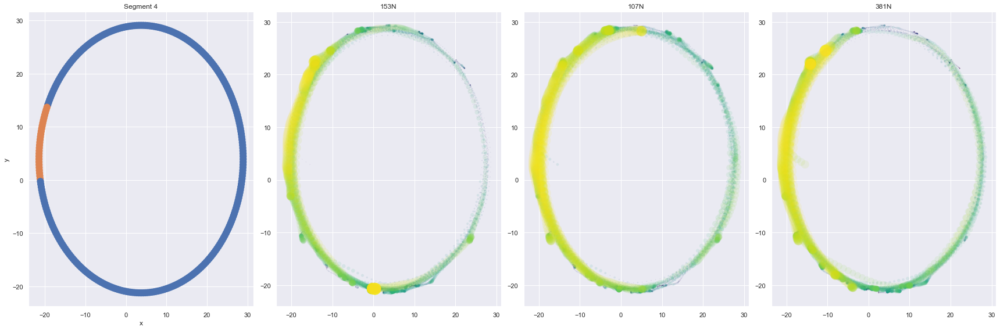

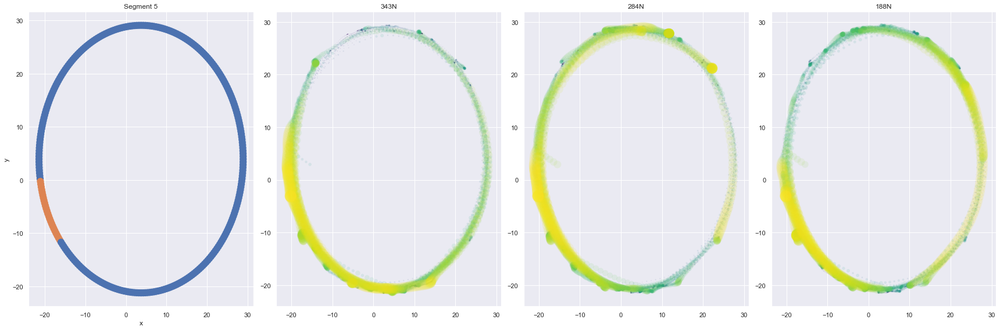

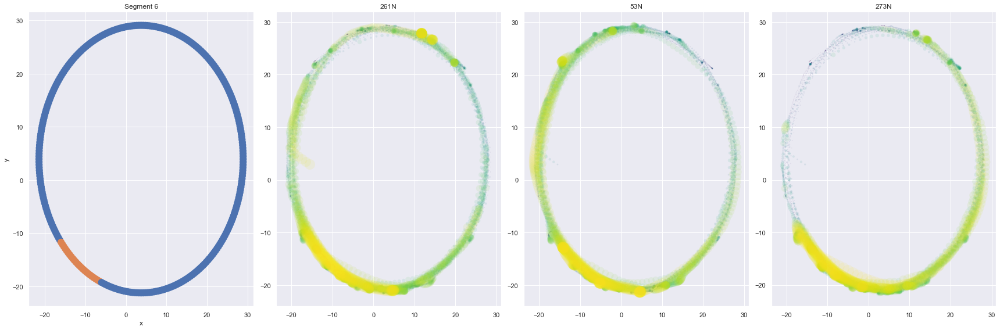

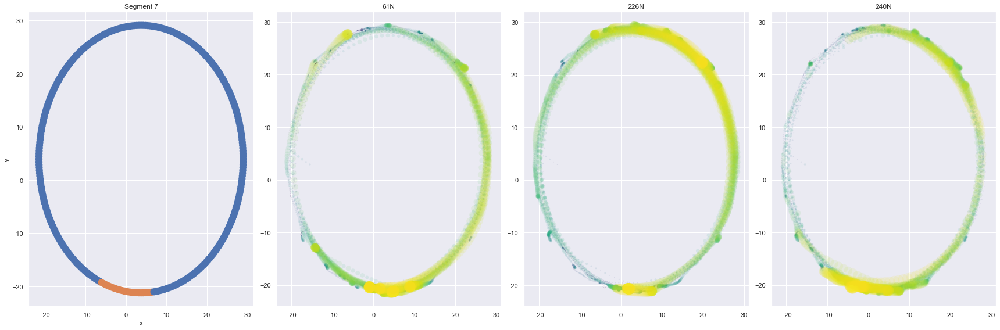

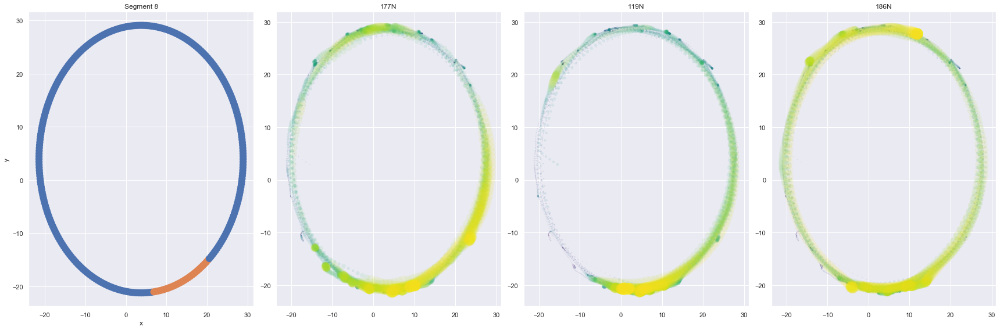

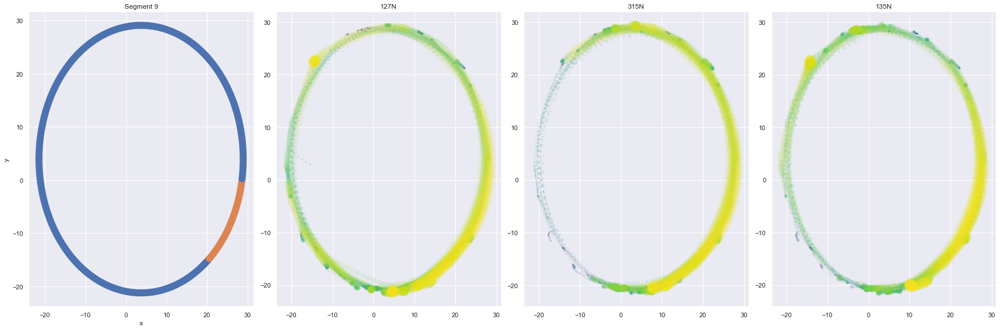

In [54]:
for segment, neurons in enumerate(lrstd_best_neurons):
    plt.figure(figsize=(24,8))
    ax = plt.subplot(1,4,1)
    
    c = generated_circle.copy()
    c['segment'] = c['segment'].apply(lambda s: 1 if s == segment else 0)
    sns.scatterplot(x='x', y='y', hue='segment',
                    data=c, 
                    ax=ax, 
                    edgecolors='none',
                    s=150,
                    linewidth=0)
    ax.get_legend().remove()
    ax.set_title(f"Segment {segment}")
    
    
    for i, col in enumerate(neurons[:3]):
        plt.subplot(1,4,i + 2)
        plt.title(col) #, fontsize=20)
        s = df.loc[:, ['x', 'y', col]].sort_values(col)
        s[col] = quantile_transform(s[col].values.reshape(-1, 1), copy=True)
        plt.scatter(s['x'], s['y'],
                    c=s[col],
                    cmap='viridis',
                    linewidth=0,
                    s=np.exp(6*s[col]),
                    alpha=0.1,
                    edgecolors='none')
    plt.tight_layout();
    plt.plot()

See Part2

## Simplicial complex

In [55]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sns.set()

from sklearn.preprocessing import quantile_transform

%matplotlib inline

In [56]:
df = pd.read_csv('data/CA1_6_1_clean.csv')

In [57]:
mis = pd.read_csv('data/mi_best_neurons.csv', index_col=0);
mi_best_neurons = mis[:24]['neuron']

In [58]:
data = df.drop(['x', 'y', 'segment'], axis=1)[mi_best_neurons[:16]]

In [59]:
data = quantile_transform(data)

/Users/th/Desktop/dev/topology/env/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:2670: FutureWarning: The default value of `copy` will change from False to True in 0.23 in order to make it more consistent with the default `copy` values of other functions in :mod:`sklearn.preprocessing` and prevent unexpected side effects by modifying the value of `X` inplace. To avoid inplace modifications of `X`, it is recommended to explicitly set `copy=True`
  FutureWarning)


In [60]:
from dionysus import Filtration, homology_persistence, init_diagrams, Simplex
from collections import Counter

In [65]:
from dionysus import Filtration, homology_persistence, init_diagrams, Simplex
from collections import Counter
from itertools import chain, combinations

def powerset(iterable):
    "powerset([1,2,3]) --> () (1,) (2,) (3,) (1,2) (1,3) (2,3) (1,2,3)"
    s = list(iterable)
    return chain.from_iterable(combinations(s, r) for r in range(len(s)+1))

def get_cycles(filtration, end_time=np.inf):
    m = homology_persistence(filtration, prime=2)
    dgms = init_diagrams(m, filtration)
    cycles = []
    for i, dgm in enumerate(dgms):
        for pt in dgm:
            cycles.append((i, pt.birth, pt.death))
    cycles = pd.DataFrame(cycles, columns=['dimension', 'birth_time', 'death_time'])
    cycles['living_time'] = cycles['death_time'] - cycles['birth_time']
    inf_life = (cycles['living_time'] == np.inf)
    cycles['living_time'][inf_life] = end_time - cycles['birth_time'][inf_life]
    return cycles.sort_values('living_time', ascending=False)



def cycles(df, time):
    # time - simplexes that live > time%
    number_of_ap = (time/100) * len(df)
    print(number_of_ap)
    
    df = quantile_transform(df)
    time = 10
    filtration = Filtration()
    all_cycles = []
    for alpha in np.arange(0.05, 0.95, 0.05):
        neuron_activity = data > alpha
        
        complexes = []
        sims = np.sum(neuron_activity * (2**np.arange(neuron_activity.shape[1])), axis=1)
        for sim, cnt in Counter(sims).items():
            if cnt > number_of_ap:
                complexes.append(np.where(np.array(list(bin(int(sim))[2:][::-1])) == '1')[0])
        
        all_simplexes = []
        for compl in complexes:
            for s in list(powerset(compl))[1:]:
                all_simplexes.append(s)
                
                
        all_simplexes = sorted(list(set(all_simplexes)), key=lambda x: len(x))
        for sim in all_simplexes:
            filtration.append(Simplex(sim, 1-alpha))
        print(filtration)
    cycles = get_cycles(filtration, 0.5)
    cycles.columns = ['%s_%.2f' % (col, float(time) / len(df) * 100) for col in cycles.columns]
    
    all_cycles.append(cycles)
    df = all_cycles[0].reset_index(drop=True)
    for i, c in enumerate(all_cycles[1:]):
        df = df.join(c.reset_index(drop=True), how='outer')
    return df

In [ ]:
cycles(data, 10)

611.9
Filtration with 65535 simplices


/Users/th/Desktop/dev/topology/env/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:2670: FutureWarning: The default value of `copy` will change from False to True in 0.23 in order to make it more consistent with the default `copy` values of other functions in :mod:`sklearn.preprocessing` and prevent unexpected side effects by modifying the value of `X` inplace. To avoid inplace modifications of `X`, it is recommended to explicitly set `copy=True`
  FutureWarning)


In [ ]:

df_k = all_cycles[0].reset_index(drop=True)
for i, c in enumerate(all_cycles[1:]):
    df_k = df_k.join(c.reset_index(drop=True), how='outer')

all_cycles, df_k

In [48]:
alpha=0.60

In [62]:
neuron_activity = data > alpha

In [63]:
neuron_activity = neuron_activity

In [64]:
sims = np.sum(neuron_activity * 2**np.arange(neuron_activity.shape[1]), axis=1)

In [65]:
c = Counter(sims)

In [66]:
common_cnt=20 # at least 2 codes for simplex exist

In [67]:
# get complexes (3 of which > common_cnt)
complexes = []
for sim, cnt in c.items():
    print(sim, cnt)
    print(bin(int(sim)))
    print(bin(int(sim))[2:]) # remove 0b
    print(bin(int(sim))[2:][::-1]) # reversed
    print(list(bin(int(sim))[2:][::-1]))
    print(np.array(list(bin(int(sim))[2:][::-1])) == '1')
    print(np.where(np.array(list(bin(int(sim))[2:][::-1])) == '1'))
    if cnt > common_cnt:
        complexes.append(np.where(np.array(list(reversed(bin(int(sim))[2:]))) == '1')[0])
    print()

2148 9
0b100001100100
100001100100
001001100001
['0', '0', '1', '0', '0', '1', '1', '0', '0', '0', '0', '1']
[False False  True False False  True  True False False False False  True]
(array([ 2,  5,  6, 11]),)

2404 3
0b100101100100
100101100100
001001101001
['0', '0', '1', '0', '0', '1', '1', '0', '1', '0', '0', '1']
[False False  True False False  True  True False  True False False  True]
(array([ 2,  5,  6,  8, 11]),)

3428 1
0b110101100100
110101100100
001001101011
['0', '0', '1', '0', '0', '1', '1', '0', '1', '0', '1', '1']
[False False  True False False  True  True False  True False  True  True]
(array([ 2,  5,  6,  8, 10, 11]),)

2340 2
0b100100100100
100100100100
001001001001
['0', '0', '1', '0', '0', '1', '0', '0', '1', '0', '0', '1']
[False False  True False False  True False False  True False False  True]
(array([ 2,  5,  8, 11]),)

2084 20
0b100000100100
100000100100
001001000001
['0', '0', '1', '0', '0', '1', '0', '0', '0', '0', '0', '1']
[False False  True False False  Tr

(array([ 3,  6,  9, 11, 12]),)

23112 3
0b101101001001000
101101001001000
000100100101101
['0', '0', '0', '1', '0', '0', '1', '0', '0', '1', '0', '1', '1', '0', '1']
[False False False  True False False  True False False  True False  True
  True False  True]
(array([ 3,  6,  9, 11, 12, 14]),)

39496 11
0b1001101001001000
1001101001001000
0001001001011001
['0', '0', '0', '1', '0', '0', '1', '0', '0', '1', '0', '1', '1', '0', '0', '1']
[False False False  True False False  True False False  True False  True
  True False False  True]
(array([ 3,  6,  9, 11, 12, 15]),)

39488 1
0b1001101001000000
1001101001000000
0000001001011001
['0', '0', '0', '0', '0', '0', '1', '0', '0', '1', '0', '1', '1', '0', '0', '1']
[False False False False False False  True False False  True False  True
  True False False  True]
(array([ 6,  9, 11, 12, 15]),)

39624 2
0b1001101011001000
1001101011001000
0001001101011001
['0', '0', '0', '1', '0', '0', '1', '1', '0', '1', '0', '1', '1', '0', '0', '1']
[False False

['0', '0', '0', '1', '0', '0', '1', '0', '0', '0', '1', '0', '1']
[False False False  True False False  True False False False  True False
  True]
(array([ 3,  6, 10, 12]),)

6218 34
0b1100001001010
1100001001010
0101001000011
['0', '1', '0', '1', '0', '0', '1', '0', '0', '0', '0', '1', '1']
[False  True False  True False False  True False False False False  True
  True]
(array([ 1,  3,  6, 11, 12]),)

4186 1
0b1000001011010
1000001011010
0101101000001
['0', '1', '0', '1', '1', '0', '1', '0', '0', '0', '0', '0', '1']
[False  True False  True  True False  True False False False False False
  True]
(array([ 1,  3,  4,  6, 12]),)

4160 2
0b1000001000000
1000001000000
0000001000001
['0', '0', '0', '0', '0', '0', '1', '0', '0', '0', '0', '0', '1']
[False False False False False False  True False False False False False
  True]
(array([ 6, 12]),)

4672 4
0b1001001000000
1001001000000
0000001001001
['0', '0', '0', '0', '0', '0', '1', '0', '0', '1', '0', '0', '1']
[False False False False Fals

(array([ 2,  3, 10, 11, 13]),)

10252 4
0b10100000001100
10100000001100
00110000000101
['0', '0', '1', '1', '0', '0', '0', '0', '0', '0', '0', '1', '0', '1']
[False False  True  True False False False False False False False  True
 False  True]
(array([ 2,  3, 11, 13]),)

33132 1
0b1000000101101100
1000000101101100
0011011010000001
['0', '0', '1', '1', '0', '1', '1', '0', '1', '0', '0', '0', '0', '0', '0', '1']
[False False  True  True False  True  True False  True False False False
 False False False  True]
(array([ 2,  3,  5,  6,  8, 15]),)

33588 2
0b1000001100110100
1000001100110100
0010110011000001
['0', '0', '1', '0', '1', '1', '0', '0', '1', '1', '0', '0', '0', '0', '0', '1']
[False False  True False  True  True False False  True  True False False
 False False False  True]
(array([ 2,  4,  5,  8,  9, 15]),)

32884 1
0b1000000001110100
1000000001110100
0010111000000001
['0', '0', '1', '0', '1', '1', '1', '0', '0', '0', '0', '0', '0', '0', '0', '1']
[False False  True False  True 

0b100011010110001
100011010110001
100011010110001
['1', '0', '0', '0', '1', '1', '0', '1', '0', '1', '1', '0', '0', '0', '1']
[ True False False False  True  True False  True False  True  True False
 False False  True]
(array([ 0,  4,  5,  7,  9, 10, 14]),)

26289 1
0b110011010110001
110011010110001
100011010110011
['1', '0', '0', '0', '1', '1', '0', '1', '0', '1', '1', '0', '0', '1', '1']
[ True False False False  True  True False  True False  True  True False
 False  True  True]
(array([ 0,  4,  5,  7,  9, 10, 13, 14]),)

26291 11
0b110011010110011
110011010110011
110011010110011
['1', '1', '0', '0', '1', '1', '0', '1', '0', '1', '1', '0', '0', '1', '1']
[ True  True False False  True  True False  True False  True  True False
 False  True  True]
(array([ 0,  1,  4,  5,  7,  9, 10, 13, 14]),)

17585 7
0b100010010110001
100010010110001
100011010010001
['1', '0', '0', '0', '1', '1', '0', '1', '0', '0', '1', '0', '0', '0', '1']
[ True False False False  True  True False  True False False

(array([ 1,  2,  3, 11, 15]),)

14 3
0b1110
1110
0111
['0', '1', '1', '1']
[False  True  True  True]
(array([1, 2, 3]),)

32780 1
0b1000000000001100
1000000000001100
0011000000000001
['0', '0', '1', '1', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '1']
[False False  True  True False False False False False False False False
 False False False  True]
(array([ 2,  3, 15]),)

34894 3
0b1000100001001110
1000100001001110
0111001000010001
['0', '1', '1', '1', '0', '0', '1', '0', '0', '0', '0', '1', '0', '0', '0', '1']
[False  True  True  True False False  True False False False False  True
 False False False  True]
(array([ 1,  2,  3,  6, 11, 15]),)

2062 1
0b100000001110
100000001110
011100000001
['0', '1', '1', '1', '0', '0', '0', '0', '0', '0', '0', '1']
[False  True  True  True False False False False False False False  True]
(array([ 1,  2,  3, 11]),)

43022 31
0b1010100000001110
1010100000001110
0111000000010101
['0', '1', '1', '1', '0', '0', '0', '0', '0', '0', '0', '1', '0

(array([ 0,  4,  5,  8, 11]),)

22929 1
0b101100110010001
101100110010001
100010011001101
['1', '0', '0', '0', '1', '0', '0', '1', '1', '0', '0', '1', '1', '0', '1']
[ True False False False  True False False  True  True False False  True
  True False  True]
(array([ 0,  4,  7,  8, 11, 12, 14]),)

23953 3
0b101110110010001
101110110010001
100010011011101
['1', '0', '0', '0', '1', '0', '0', '1', '1', '0', '1', '1', '1', '0', '1']
[ True False False False  True False False  True  True False  True  True
  True False  True]
(array([ 0,  4,  7,  8, 10, 11, 12, 14]),)

23985 1
0b101110110110001
101110110110001
100011011011101
['1', '0', '0', '0', '1', '1', '0', '1', '1', '0', '1', '1', '1', '0', '1']
[ True False False False  True  True False  True  True False  True  True
  True False  True]
(array([ 0,  4,  5,  7,  8, 10, 11, 12, 14]),)

22417 2
0b101011110010001
101011110010001
100010011110101
['1', '0', '0', '0', '1', '0', '0', '1', '1', '1', '1', '0', '1', '0', '1']
[ True False False Fa

In [68]:
# get all simplexes
all_simplexes = []
for compl in complexes:
    for s in list(powerset(compl))[1:]:
        all_simplexes.append(s)

In [69]:
len(all_simplexes)

9233

In [82]:
all_simplexes[0]

(3,)

In [60]:
filtration = Filtration()

In [74]:
set(all_simplexes)

{(0, 1, 4, 8),
 (1, 2, 8),
 (1, 4, 5, 7, 8, 10, 14),
 (1, 4, 8, 10, 14, 15),
 (3, 5, 12, 15),
 (3, 6, 11),
 (0, 1, 4, 8, 9, 10, 15),
 (0, 1, 7, 8, 10, 13, 14, 15),
 (0, 2, 4, 5, 7, 9),
 (7, 8, 10, 14, 15),
 (4, 5, 8, 9, 13),
 (2, 3, 5, 11),
 (1, 4, 8, 13),
 (3, 5, 6, 11, 12, 15),
 (0, 4, 10),
 (7, 9, 14),
 (1, 4, 8, 10, 13),
 (1, 3, 13, 15),
 (2, 5, 8, 13),
 (5, 8, 15),
 (1, 4, 8, 13, 15),
 (0, 4, 9, 14),
 (4, 7, 14),
 (5, 11, 13, 15),
 (2, 4, 7, 8, 10, 14),
 (3, 5, 11, 15),
 (1, 9, 14, 15),
 (0, 4, 7, 14, 15),
 (2, 4, 5, 7, 8),
 (0, 9, 10, 13),
 (2, 6, 15),
 (5, 7, 9, 13),
 (2, 4, 5, 7),
 (1, 8, 9, 13, 14, 15),
 (1, 5, 7, 8, 9, 10, 14),
 (2, 3, 6, 11, 12, 13, 15),
 (1, 2, 4, 7, 8, 9, 14),
 (0, 14),
 (0, 7, 8, 10, 13, 14),
 (0, 2, 5, 7, 9, 10, 14),
 (3, 11),
 (7, 14, 15),
 (0, 1, 4, 8, 14, 15),
 (0, 1, 4, 7, 8, 9, 10, 14, 15),
 (0, 4, 7, 8, 9, 10, 13, 15),
 (2, 4, 5, 8, 11, 12),
 (0, 2, 5, 7, 8, 9, 14),
 (7, 15),
 (4, 6, 13),
 (1, 4, 7, 8, 9, 10, 15),
 (6, 9, 13, 15),
 (0, 1, 2, 4, 7, 

In [61]:
all_simplexes = sorted(list(set(all_simplexes)), key=lambda x: len(x))

In [72]:
for sim in all_simplexes:
    filtration.append(Simplex(sim, alpha))

In [73]:
filtration

Filtration with 2636 simplices

#  Simple example

In [229]:
simplices = [
    [1, 2, 9, 11],
    [9, 10, 11],
    [7,8,10],
    [6,7,8],
    [3,4,5],
    [2,3],
    [3,6],
    [7,9]
]

In [252]:
all_simplexes = []
for compl in simplices:
    for s in list(powerset(compl))[1:]:
        all_simplexes.append(s)
all_simplexes = sorted(list(set(all_simplexes)), key=lambda x: len(x))
filtration = Filtration()
for sim in all_simplexes:
    filtration.append(Simplex(sim, 1 - alpha))

In [253]:
filtration

Filtration with 39 simplices

In [263]:
f = filtration

In [254]:
m = homology_persistence(filtration)

In [255]:
for i,c in enumerate(m):
    print(i, c)

0 
1 
2 
3 
4 
5 
6 
7 
8 
9 
10 
11 1*1 + 1*7
12 1*1 + 1*2
13 1*2 + 1*8
14 1*5 + 1*10
15 1*0 + 1*1
16 1*1 + 1*6
17 
18 1*1 + 1*5
19 1*1 + 1*3
20 1*3 + 1*9
21 1*3 + 1*4
22 
23 
24 
25 
26 
27 
28 
29 
30 1*13 + 1*15 + 1*23
31 1*12 + 1*13 + 1*28
32 1*11 + 1*17 + 1*22
33 1*14 + 1*27 + 1*29
34 1*14 + 1*16 + 1*18 + 1*27
35 1*12 + 1*13 + 1*15 + 1*17
36 
37 1*20 + 1*21 + 1*25
38 1*30 + 1*31 + 1*35 + 1*36


In [266]:
dgms = init_diagrams(m, f)
for i, dgm in enumerate(dgms):
    print("Dimension:", i)
    for p in dgm:
        print(p)

Dimension: 0
(0.5,inf)
Dimension: 1
(0.5,inf)
(0.5,inf)
Dimension: 2
Dimension: 3
